<a href="https://www.kaggle.com/code/sadimrahmanbadhan/diabetes-detection?scriptVersionId=159490142" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# Importing modules
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
%matplotlib inline

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/opt/conda/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/opt/conda/lib/python3.10/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


/kaggle/input/diabetes-dataset/diabetes.csv


In [2]:
path = "/kaggle/input/diabetes-dataset/diabetes.csv"

# Loading the data
df = pd.read_csv(path)

# Peeking on first few data
df.head(20)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


In [3]:
# Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [4]:
# Basic Statistic
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


array([[<Axes: title={'center': 'Pregnancies'}>,
        <Axes: title={'center': 'Glucose'}>,
        <Axes: title={'center': 'BloodPressure'}>],
       [<Axes: title={'center': 'SkinThickness'}>,
        <Axes: title={'center': 'Insulin'}>,
        <Axes: title={'center': 'BMI'}>],
       [<Axes: title={'center': 'DiabetesPedigreeFunction'}>,
        <Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Outcome'}>]], dtype=object)

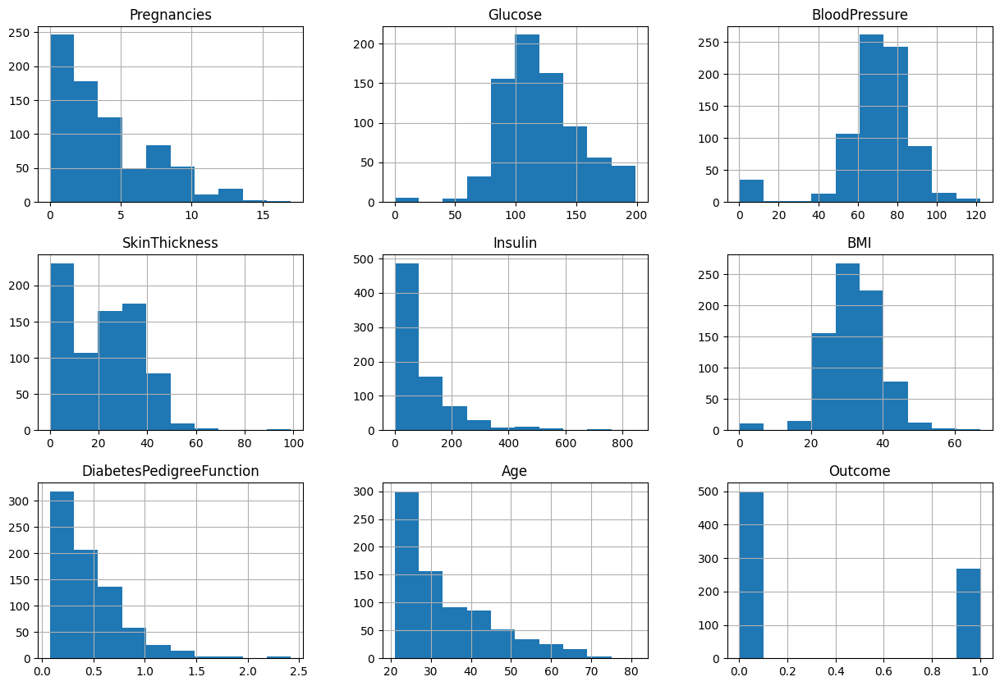

In [5]:
# Checking the distribution of each data
df.hist(figsize=(15,10))

According to Google
> **Diabetes Pedigree Function (DPF)** calculates diabetes likelihood depending on the subject's age and his/her diabetic family history

[Discussion](https://www.kaggle.com/datasets/akshaydattatraykhare/diabetes-dataset/discussion/390005#2177498)

In [6]:
# Missing Values
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

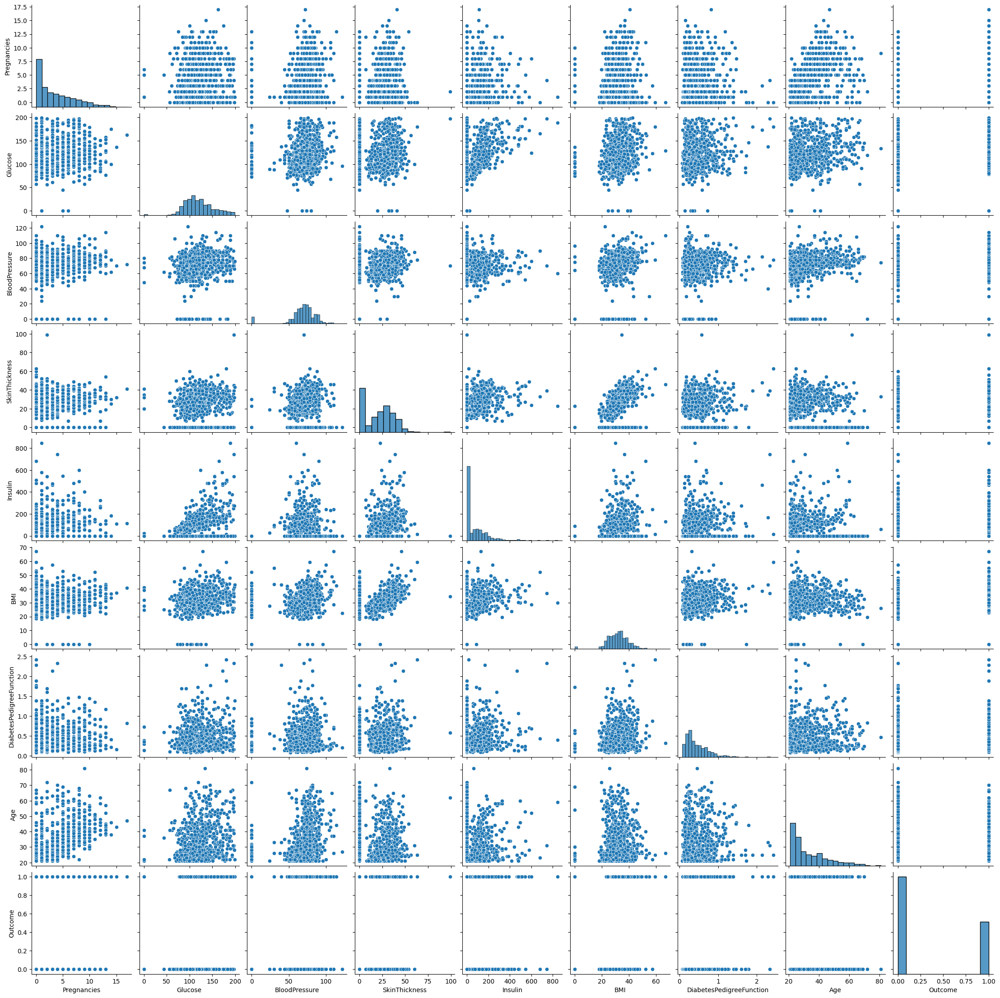

In [7]:
# Plotting the correlation
seaborn.pairplot(df)

<Axes: >

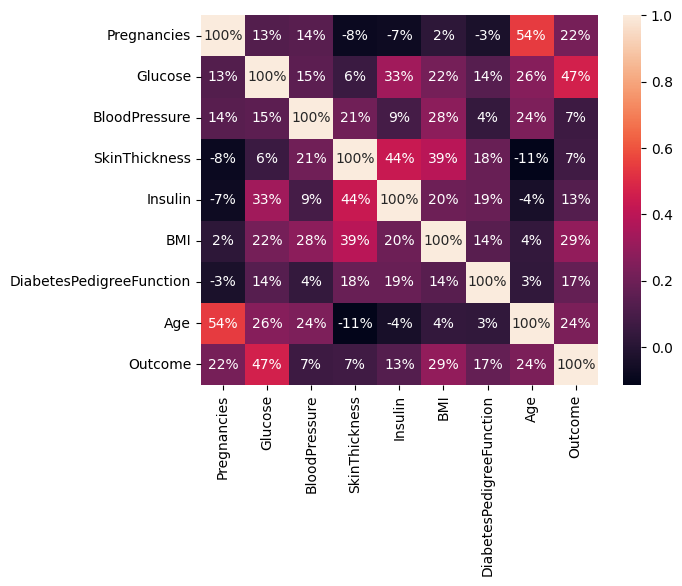

In [8]:
# Correlation heatmap - Pearson %
correlation_matrix = df.corr()
seaborn.heatmap(correlation_matrix, annot=True, fmt=".0%")

<Axes: >

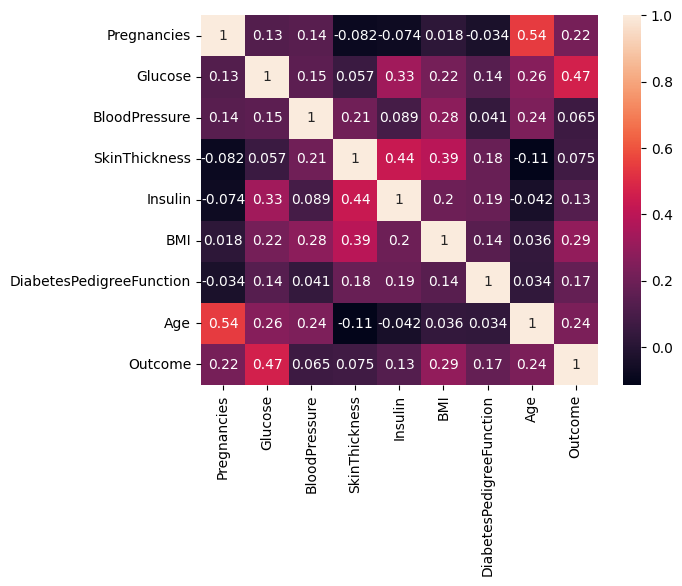

In [9]:
# Correlation Heatmap 
seaborn.heatmap(correlation_matrix, annot=True)

In [10]:
# EDA with ydata profiling
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### According to data profiler and the discussion forum of the data source, the missing values has been replaced with zeros which has be dealt with because 0 as value in glucose, blood pressure, skin thickness, insulin, BMI doesn't make sense.

In [11]:
# Mean Imputation for Glucose, BloodPressure, Skin thickness, Insulin, BMI column
glucoseMean = df['Glucose'].mean()
bpressureMean = df['BloodPressure'].mean()
sthicknessMean = df['SkinThickness'].mean()
insulinMean = df['Insulin'].mean()
bmiMean = df['BMI'].mean()

# Changing values in dataframe
df.loc[df['Glucose'] == 0, 'Glucose'] = glucoseMean
df.loc[df['BloodPressure'] == 0, 'BloodPressure'] = bpressureMean
df.loc[df['SkinThickness'] == 0, 'SkinThickness'] = sthicknessMean
df.loc[df['Insulin'] == 0, 'Insulin'] = insulinMean
df.loc[df['BMI'] == 0, 'BMI'] = bmiMean

In [12]:
# Basic Statistic
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.000000,3.000000,6.00000,17.00
Glucose,768.0,121.681605,30.436016,44.000,99.750000,117.000000,140.25000,199.00
BloodPressure,768.0,72.254807,12.115932,24.000,64.000000,72.000000,80.00000,122.00
SkinThickness,768.0,26.606479,9.631241,7.000,20.536458,23.000000,32.00000,99.00
Insulin,768.0,118.660163,93.080358,14.000,79.799479,79.799479,127.25000,846.00
BMI,768.0,32.450805,6.875374,18.200,27.500000,32.000000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.243750,0.372500,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.000000,29.000000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.000000,0.000000,1.00000,1.00


In [13]:
# Preparing data for training 
features = df.drop('Outcome', axis=1)
label = df['Outcome']

# Spliting the data
ftrain, ftest, ltrain, ltest = train_test_split(features, label, test_size=20)

In [14]:
# Models - Logistic Regression, Decision Tree/CART
model = LogisticRegression(max_iter=2000)
ctmodel = DecisionTreeClassifier()

In [15]:
# Fiting the data on the model
model.fit(ftrain, ltrain)
ctmodel.fit(ftrain, ltrain)

DecisionTreeClassifier()

In [16]:
# Evaluation
lrpred = model.predict(ftest)
ctpred = ctmodel.predict(ftest)

# Accuracy
print(f"Accuracy of Logistic Regression: { accuracy_score(ltest, lrpred) }")
print(f"Accuracy of Classification Tree: { accuracy_score(ltest, ctpred)}")

Accuracy of Logistic Regression: 0.7
Accuracy of Classification Tree: 0.65


Text(0.5, 1.0, 'Logistic Regression')

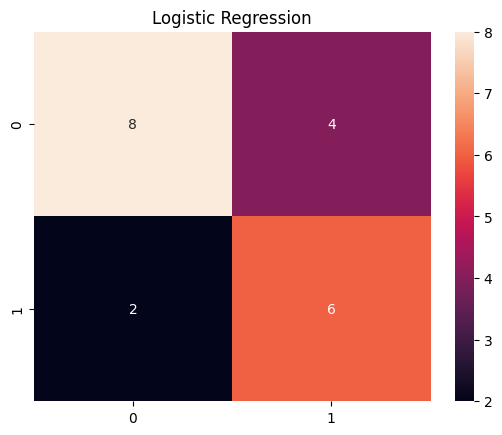

In [17]:
# Confusion Matrix - LR
seaborn.heatmap(confusion_matrix(ltest, lrpred), annot=True,)
plt.title("Logistic Regression")

Text(0.5, 1.0, 'Classification Tree')

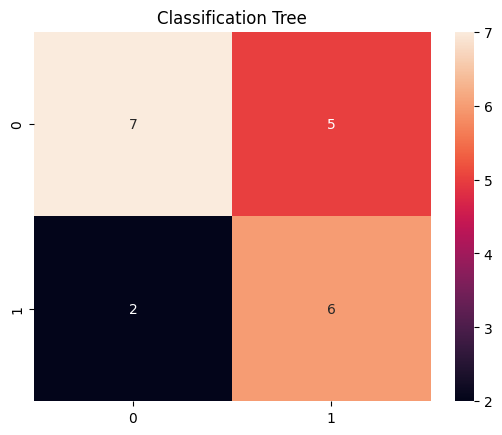

In [18]:
# Confusion Matrix - CART
seaborn.heatmap(confusion_matrix(ltest, ctpred), annot=True)
plt.title("Classification Tree")

In [19]:
# Classification Report
print("Logistic Regression")
print(classification_report(ltest, lrpred))
print("Classification Tree")
print(classification_report(ltest, ctpred))

Logistic Regression
              precision    recall  f1-score   support

           0       0.80      0.67      0.73        12
           1       0.60      0.75      0.67         8

    accuracy                           0.70        20
   macro avg       0.70      0.71      0.70        20
weighted avg       0.72      0.70      0.70        20

Classification Tree
              precision    recall  f1-score   support

           0       0.78      0.58      0.67        12
           1       0.55      0.75      0.63         8

    accuracy                           0.65        20
   macro avg       0.66      0.67      0.65        20
weighted avg       0.68      0.65      0.65        20

